<h1 style='text-align:center'><b>Analisa Penerapan Canny Edge Detection untuk Citra Marka Jalan pada Kondisi Tertentu</h1>

<h2>1. Siang Cerah</h2>

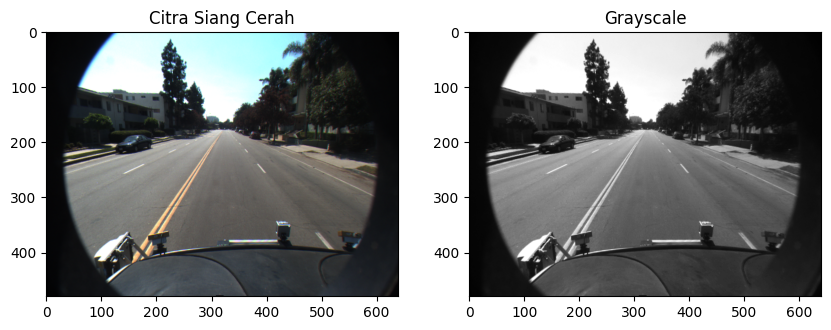

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt

# Load citra
siangCerah = cv.imread('biasa.png')
siangCerahGS = cv.cvtColor(siangCerah, cv.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(siangCerah, cv.COLOR_BGR2RGB))
axs[0].set_title('Citra Siang Cerah')
axs[1].imshow(siangCerahGS, cmap='gray')
axs[1].set_title('Grayscale')
plt.show()


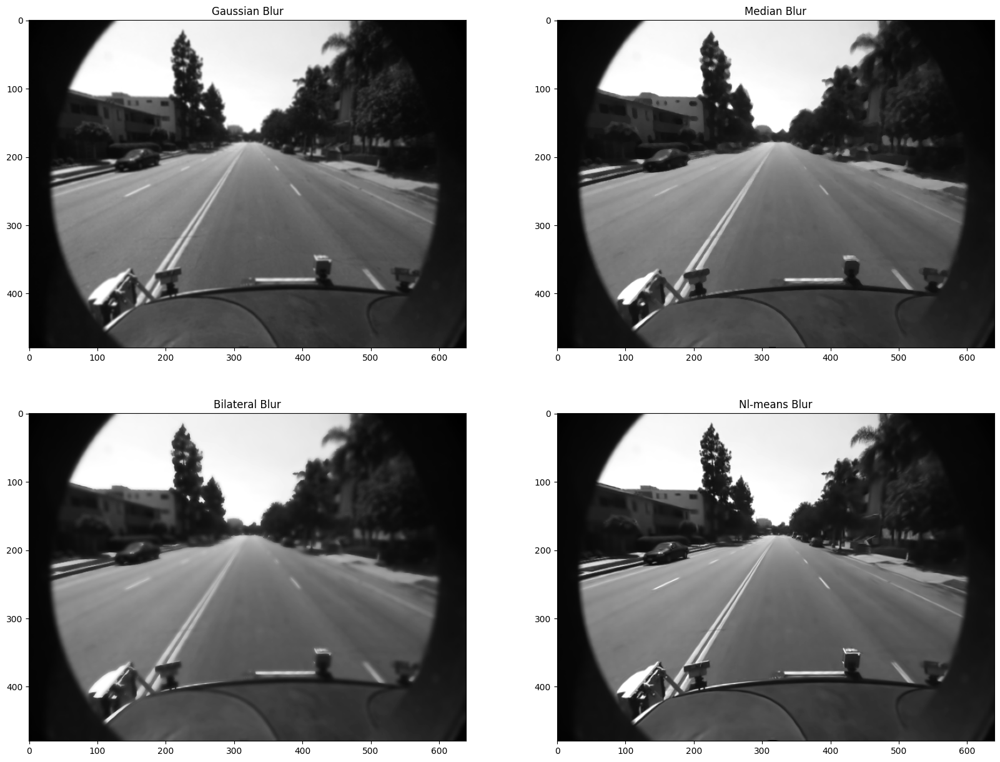

In [2]:
# filter Gaussian Blur
gaussianSC = cv.GaussianBlur(siangCerahGS, (5, 5), 0)

# filter Median Blur
medianSC = cv.medianBlur(siangCerahGS, 5)

# Bilateral Filter
bilateralSC = cv.bilateralFilter(siangCerahGS, 9, 75, 75)

# Non-local Means Filter
nl_meansSC = cv.fastNlMeansDenoising(siangCerahGS, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianSC, cmap='gray')
axs[0, 0].set_title('Gaussian Blur')
axs[0, 1].imshow(medianSC, cmap='gray')
axs[0, 1].set_title('Median Blur')
axs[1, 0].imshow(bilateralSC, cmap='gray')
axs[1, 0].set_title('Bilateral Blur')
axs[1, 1].imshow(nl_meansSC, cmap='gray')
axs[1, 1].set_title('Nl-means Blur')

plt.show()

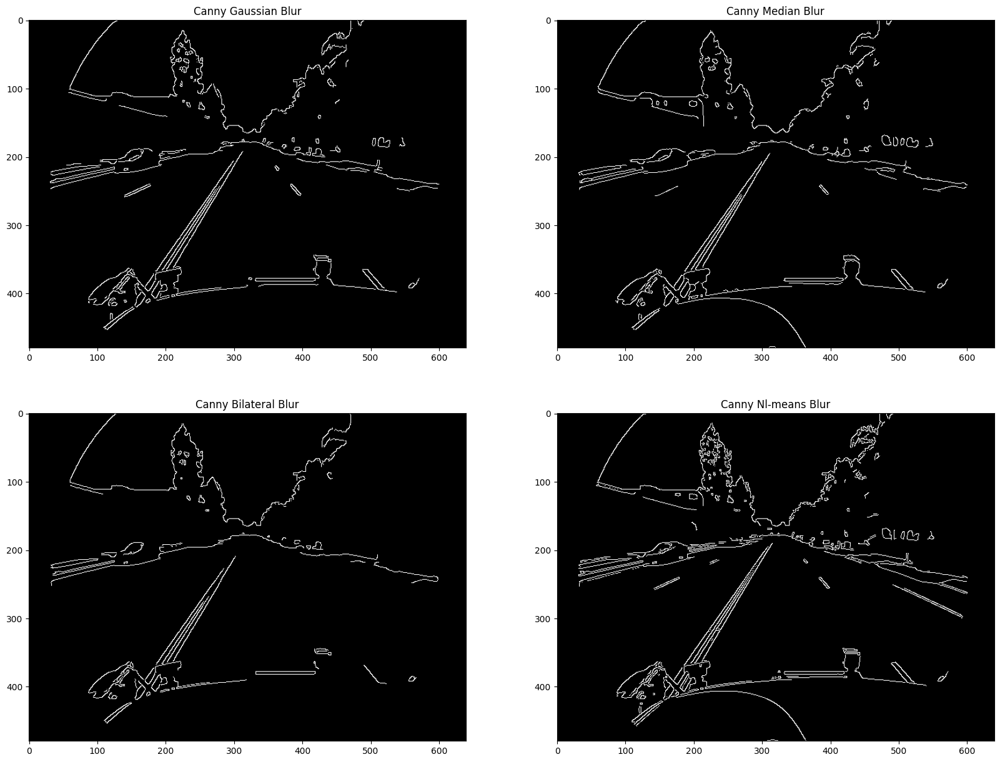

In [3]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianSC = cv.Canny(gaussianSC, 100, 200)
cannyMedianSC = cv.Canny(medianSC, 100, 200)
cannyBilateralSC = cv.Canny(bilateralSC, 100, 200)
cannyNlMeansSC = cv.Canny(nl_meansSC, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianSC, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur')
axs[0, 1].imshow(cannyMedianSC, cmap='gray')
axs[0, 1].set_title('Canny Median Blur')
axs[1, 0].imshow(cannyBilateralSC, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur')
axs[1, 1].imshow(cannyNlMeansSC, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur')

plt.show()

<h2>2. Hujan Siang Hari</h2>

In [4]:
import numpy as np

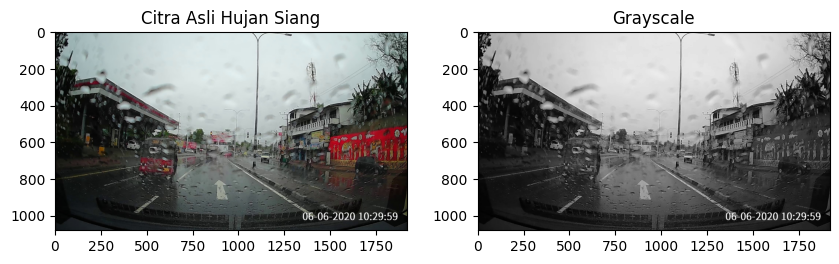

In [5]:
# Load citra
citraHujanSiang = cv.imread('hujan.jpg')
grayHS = cv.cvtColor(citraHujanSiang, cv.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(citraHujanSiang, cv.COLOR_BGR2RGB))
axs[0].set_title('Citra Asli Hujan Siang')
axs[1].imshow(grayHS, cmap='gray')
axs[1].set_title('Grayscale')
plt.show()

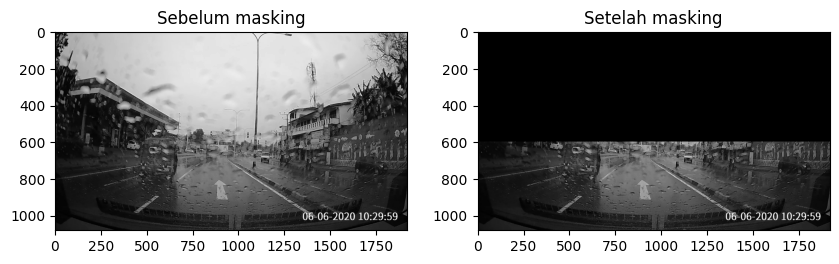

In [6]:
# hilangkan objek yang tidak perlu dengan masking
mask = np.zeros_like(grayHS)
x, y, w, h = 0, 600, 2000, 1000
cv.rectangle(mask, (x, y), (x + w, y + h), (255, 255, 255), -1)
maskedHS = cv.bitwise_and(grayHS, mask)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(grayHS, cmap='gray')
axs[0].set_title('Sebelum masking')
axs[1].imshow(maskedHS, cmap='gray')
axs[1].set_title('Setelah masking')
plt.show()
plt.show()

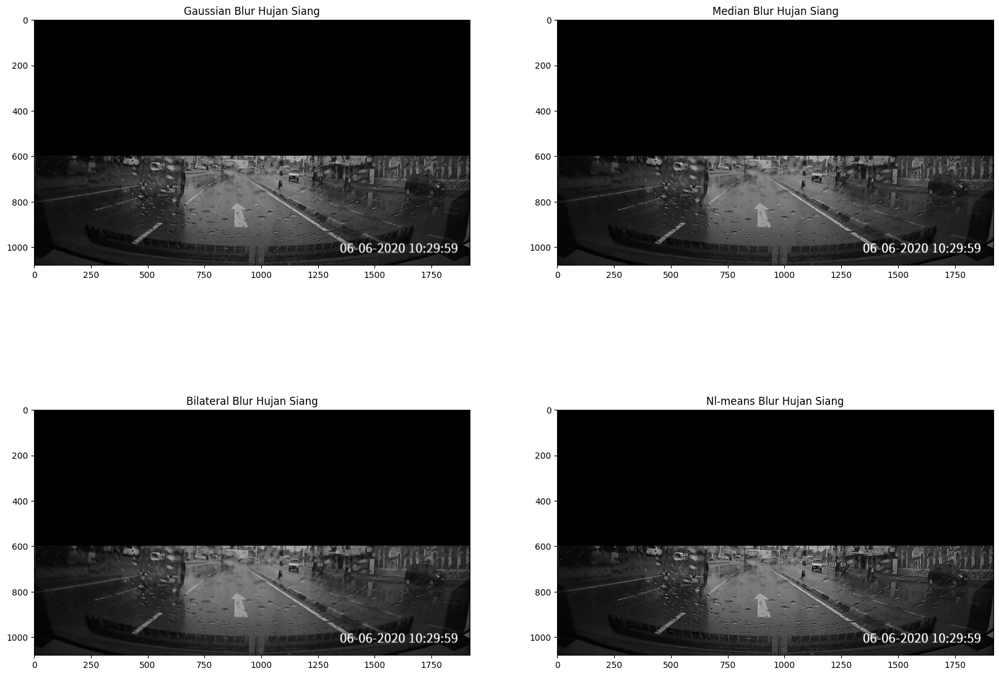

In [7]:
# filter Gaussian Blur
gaussianHS = cv.GaussianBlur(maskedHS, (5, 5), 0)

# filter Median Blur
medianHS = cv.medianBlur(maskedHS, 5)

# Bilateral Filter
bilateralHS = cv.bilateralFilter(maskedHS, 9, 75, 75)

# Non-local Means Filter
nl_meansHS = cv.fastNlMeansDenoising(maskedHS, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianHS, cmap='gray')
axs[0, 0].set_title('Gaussian Blur Hujan Siang')
axs[0, 1].imshow(medianHS, cmap='gray')
axs[0, 1].set_title('Median Blur Hujan Siang')
axs[1, 0].imshow(bilateralHS, cmap='gray')
axs[1, 0].set_title('Bilateral Blur Hujan Siang')
axs[1, 1].imshow(nl_meansHS, cmap='gray')
axs[1, 1].set_title('Nl-means Blur Hujan Siang')

plt.show()

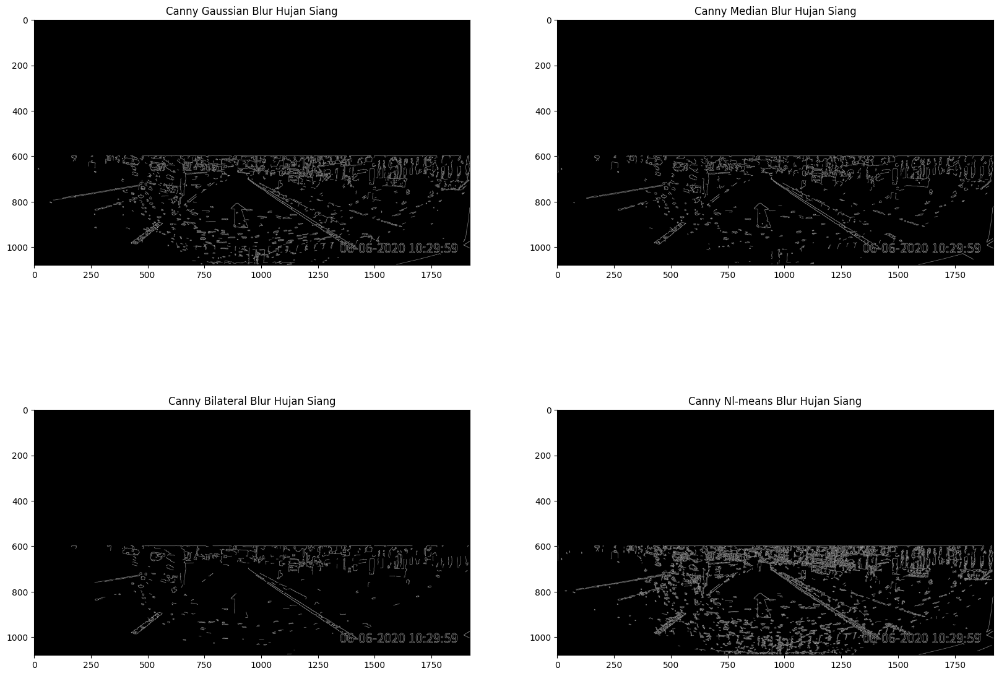

In [8]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianHS = cv.Canny(gaussianHS, 100, 200)
cannyMedianHS = cv.Canny(medianHS, 100, 200)
cannyBilateralHS = cv.Canny(bilateralHS, 100, 200)
cannyNlMeansHS = cv.Canny(nl_meansHS, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianHS, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur Hujan Siang')
axs[0, 1].imshow(cannyMedianHS, cmap='gray')
axs[0, 1].set_title('Canny Median Blur Hujan Siang')
axs[1, 0].imshow(cannyBilateralHS, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur Hujan Siang')
axs[1, 1].imshow(cannyNlMeansHS, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur Hujan Siang')

plt.show()

<h3>3. Malam Cerah</h3>

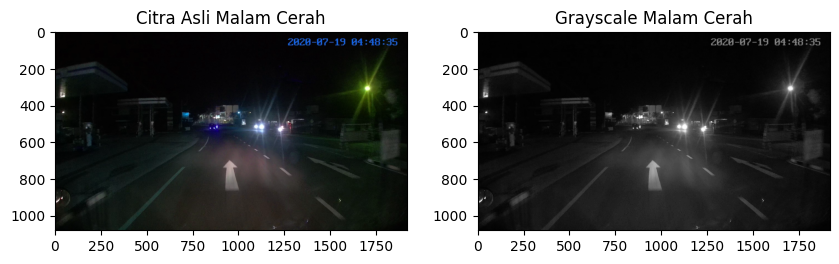

In [9]:
# Load citra
citraMC = cv.imread('malam2.jpg')
grayMC = cv.cvtColor(citraMC, cv.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(citraMC)
axs[0].set_title('Citra Asli Malam Cerah')
axs[1].imshow(grayMC, cmap='gray')
axs[1].set_title('Grayscale Malam Cerah')
plt.show()

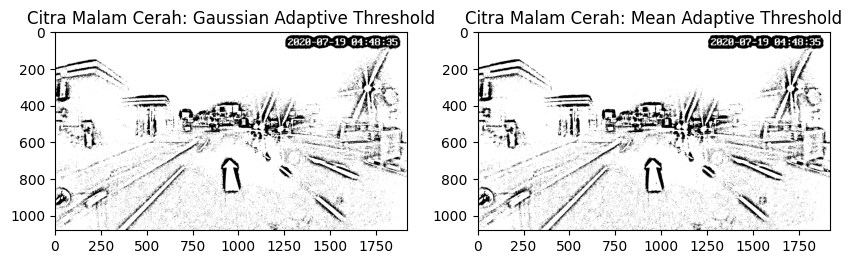

In [10]:
#Gunakan adaptive thresholding karena pencahayaan yang minim

gaussianTHMC = cv.adaptiveThreshold(grayMC, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 79, 6)
meanTHMC = cv.adaptiveThreshold(grayMC, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 41, 6)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(gaussianTHMC, cmap='gray')
axs[0].set_title('Citra Malam Cerah: Gaussian Adaptive Threshold')
axs[1].imshow(meanTHMC, cmap='gray')
axs[1].set_title('Citra Malam Cerah: Mean Adaptive Threshold')
plt.show()

<h4>a. Malam Cerah : Gaussian Threshold</h4>

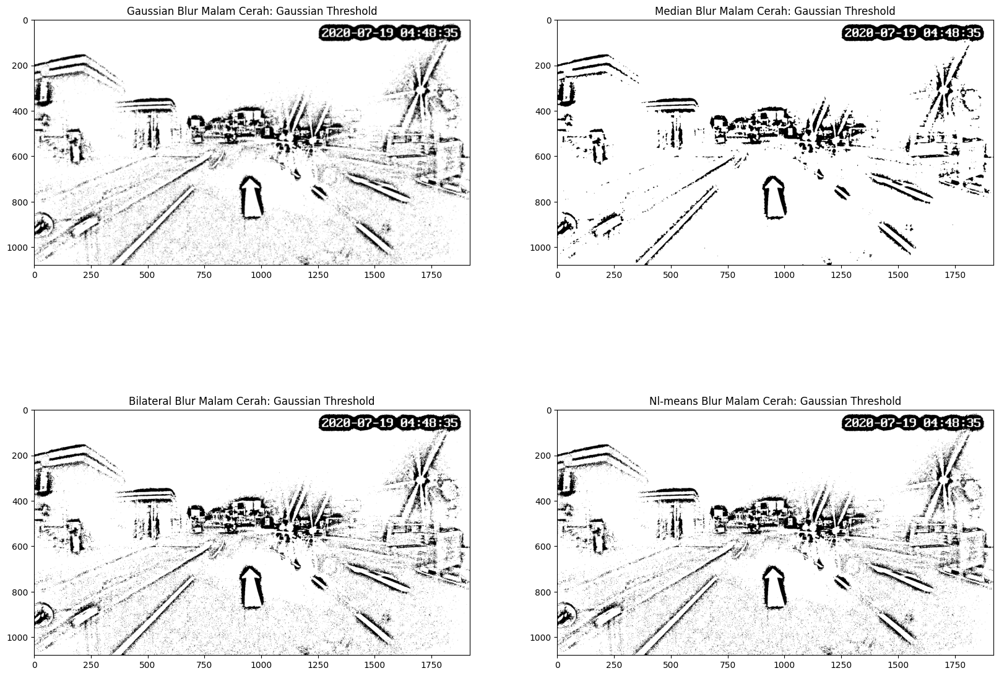

In [11]:
# filter Gaussian Blur
gaussianMCGAT = cv.GaussianBlur(gaussianTHMC, (5, 5), 0)

# filter Median Blur
medianMCGAT = cv.medianBlur(gaussianTHMC, 5)

# Bilateral Filter
bilateralMCGAT = cv.bilateralFilter(gaussianTHMC, 9, 75, 75)

# Non-local Means Filter
nl_meansMCGAT = cv.fastNlMeansDenoising(gaussianTHMC, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianMCGAT, cmap='gray')
axs[0, 0].set_title('Gaussian Blur Malam Cerah: Gaussian Threshold')
axs[0, 1].imshow(medianMCGAT, cmap='gray')
axs[0, 1].set_title('Median Blur Malam Cerah: Gaussian Threshold')
axs[1, 0].imshow(bilateralMCGAT, cmap='gray')
axs[1, 0].set_title('Bilateral Blur Malam Cerah: Gaussian Threshold')
axs[1, 1].imshow(nl_meansMCGAT, cmap='gray')
axs[1, 1].set_title('Nl-means Blur Malam Cerah: Gaussian Threshold')

plt.show()

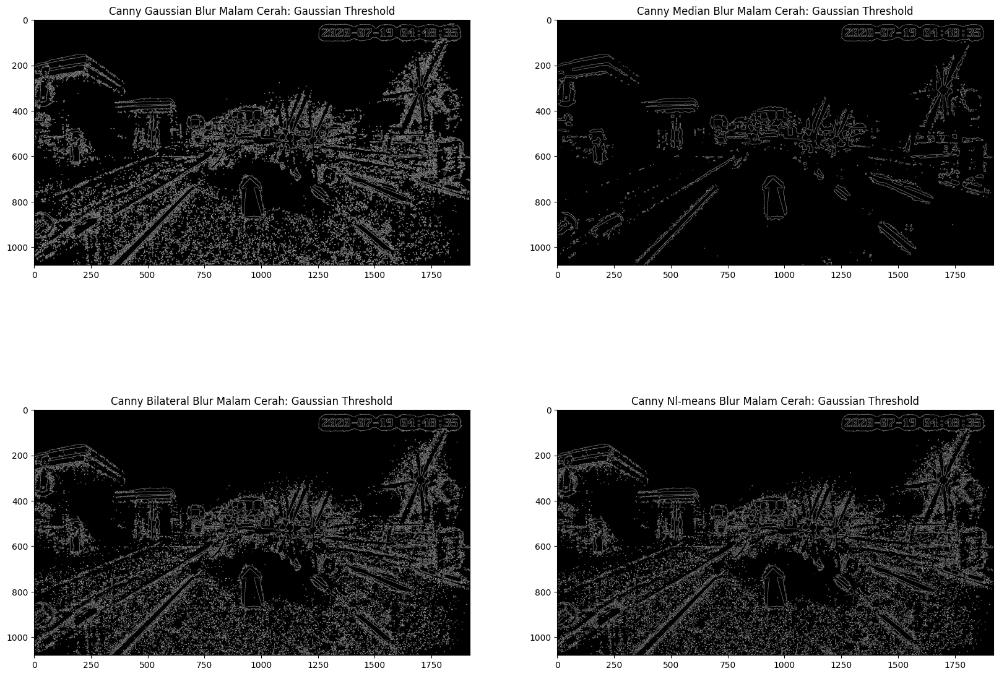

In [12]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianMCGAT = cv.Canny(gaussianMCGAT, 100, 200)
cannyMedianMCGAT = cv.Canny(medianMCGAT, 100, 200)
cannyBilateralMCGAT = cv.Canny(bilateralMCGAT, 100, 200)
cannyNlMeansMCGAT = cv.Canny(nl_meansMCGAT, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianMCGAT, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur Malam Cerah: Gaussian Threshold')
axs[0, 1].imshow(cannyMedianMCGAT, cmap='gray')
axs[0, 1].set_title('Canny Median Blur Malam Cerah: Gaussian Threshold')
axs[1, 0].imshow(cannyBilateralMCGAT, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur Malam Cerah: Gaussian Threshold')
axs[1, 1].imshow(cannyNlMeansMCGAT, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur Malam Cerah: Gaussian Threshold')

plt.show()

<h4>b. Malam Cerah Mean Threshold</h4>

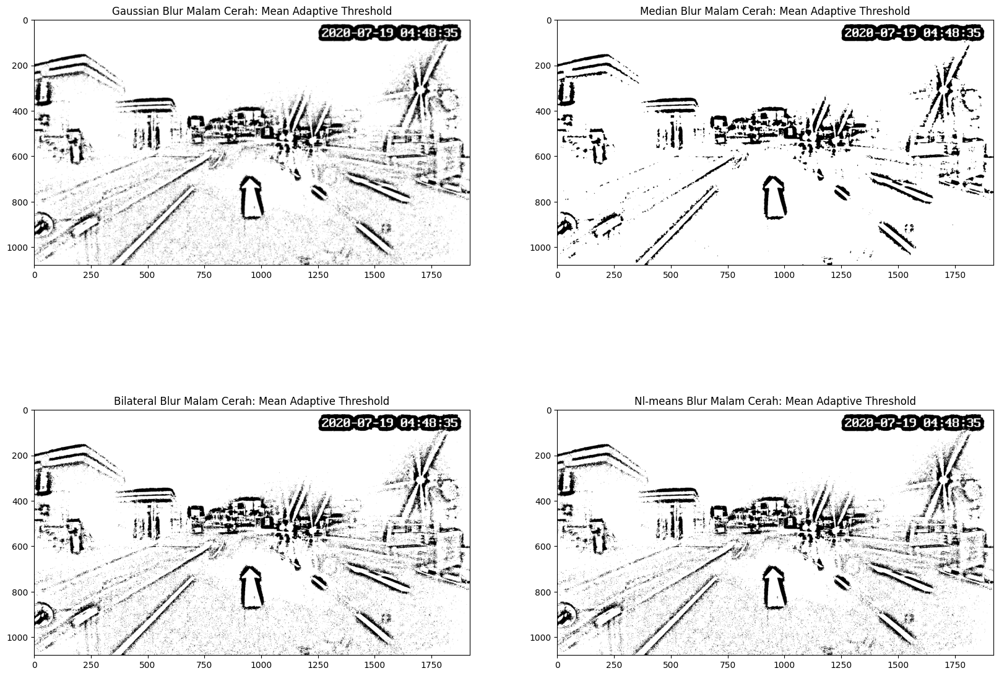

In [13]:
# filter Gaussian Blur
gaussianMCMAT = cv.GaussianBlur(meanTHMC, (5, 5), 0)

# filter Median Blur
medianMCMAT = cv.medianBlur(meanTHMC, 5)

# Bilateral Filter
bilateralMCMAT = cv.bilateralFilter(meanTHMC, 9, 75, 75)

# Non-local Means Filter
nl_meansMCMAT = cv.fastNlMeansDenoising(meanTHMC, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianMCMAT, cmap='gray')
axs[0, 0].set_title('Gaussian Blur Malam Cerah: Mean Adaptive Threshold')
axs[0, 1].imshow(medianMCMAT, cmap='gray')
axs[0, 1].set_title('Median Blur Malam Cerah: Mean Adaptive Threshold')
axs[1, 0].imshow(bilateralMCMAT, cmap='gray')
axs[1, 0].set_title('Bilateral Blur Malam Cerah: Mean Adaptive Threshold')
axs[1, 1].imshow(nl_meansMCMAT, cmap='gray')
axs[1, 1].set_title('Nl-means Blur Malam Cerah: Mean Adaptive Threshold')

plt.show()

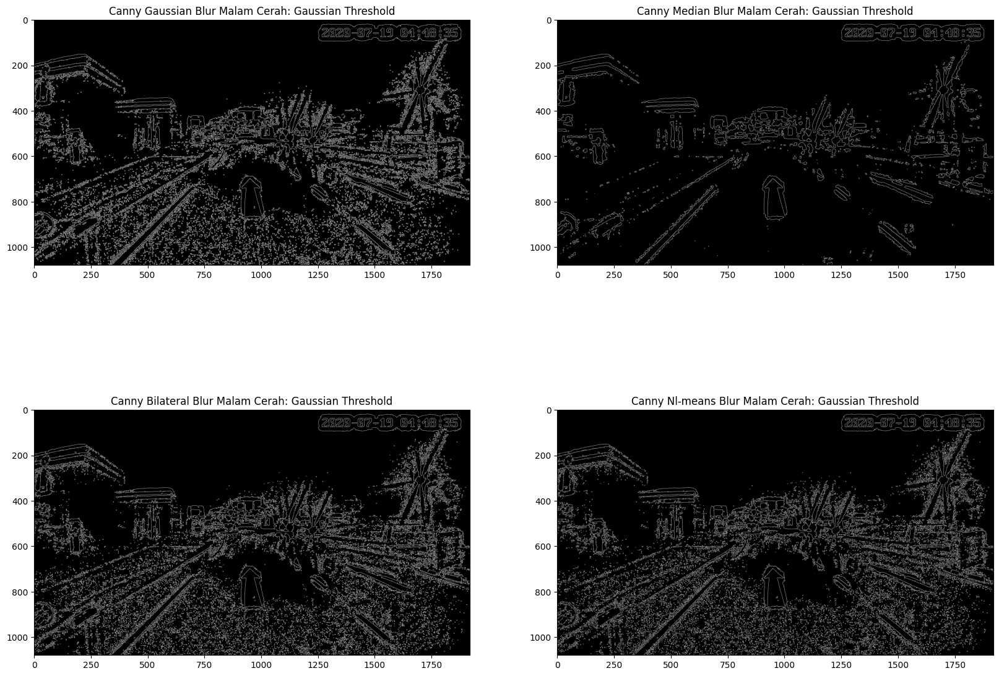

In [14]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianMCMAT = cv.Canny(gaussianMCMAT, 100, 200)
cannyMedianMCMAT = cv.Canny(medianMCMAT, 100, 200)
cannyBilateralMCMAT = cv.Canny(bilateralMCMAT, 100, 200)
cannyNlMeansMCMAT = cv.Canny(nl_meansMCMAT, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianMCMAT, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur Malam Cerah: Gaussian Threshold')
axs[0, 1].imshow(cannyMedianMCMAT, cmap='gray')
axs[0, 1].set_title('Canny Median Blur Malam Cerah: Gaussian Threshold')
axs[1, 0].imshow(cannyBilateralMCMAT, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur Malam Cerah: Gaussian Threshold')
axs[1, 1].imshow(cannyNlMeansMCMAT, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur Malam Cerah: Gaussian Threshold')

plt.show()

<h3>4. Hujan Malam</h3>

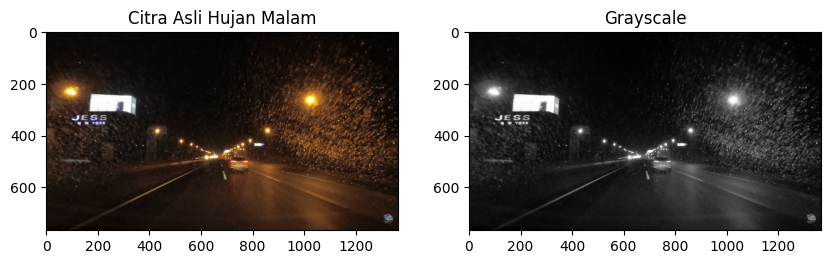

In [15]:
# Load citra
citraHM = cv.imread('malamhujan.png')
grayHM = cv.cvtColor(citraHM, cv.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(citraHM, cv.COLOR_BGR2RGB))
axs[0].set_title('Citra Asli Hujan Malam')
axs[1].imshow(grayHM, cmap='gray')
axs[1].set_title('Grayscale')
plt.show()

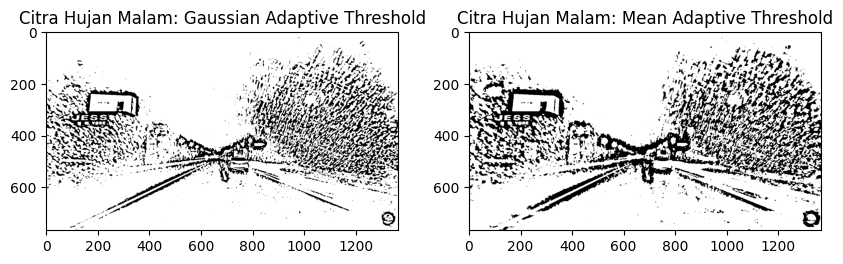

In [16]:
#Gunakan adaptive thresholding karena pencahayaan yang minim

gaussianTHHM = cv.adaptiveThreshold(grayHM, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 41, 6)
meanTHHM = cv.adaptiveThreshold(grayHM, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 41, 6)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(gaussianTHHM, cmap='gray')
axs[0].set_title('Citra Hujan Malam: Gaussian Adaptive Threshold')
axs[1].imshow(meanTHHM, cmap='gray')
axs[1].set_title('Citra Hujan Malam: Mean Adaptive Threshold')
plt.show()

<h4>a. Gaussian Adaptive Threshold</h4>

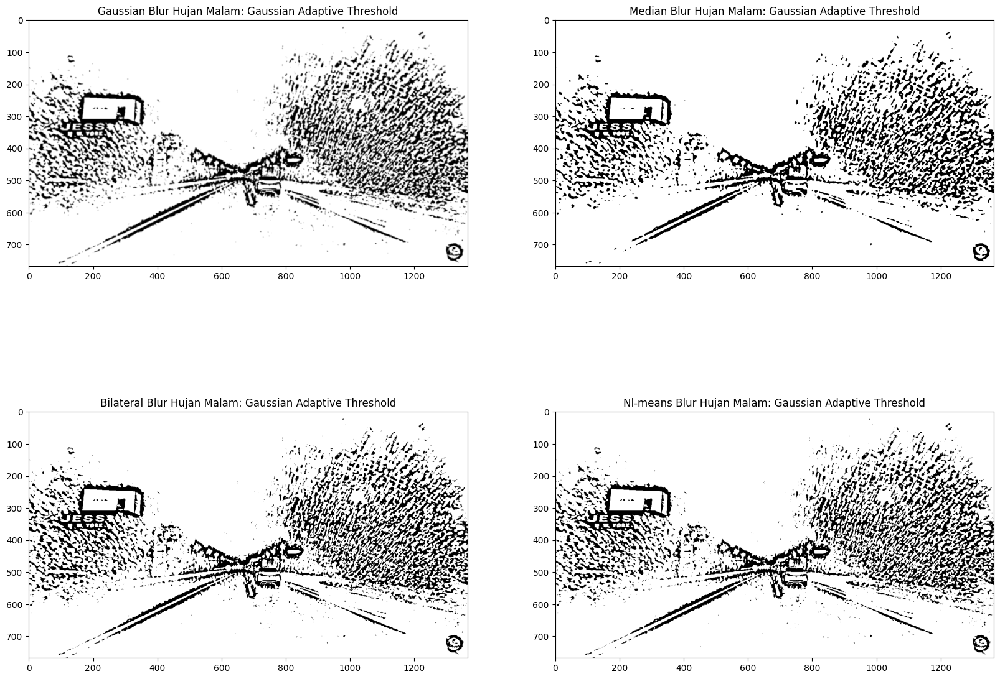

In [17]:
# filter Gaussian Blur
gaussianHMGAT = cv.GaussianBlur(gaussianTHHM, (5, 5), 0)

# filter Median Blur
medianHMGAT = cv.medianBlur(gaussianTHHM, 5)

# Bilateral Filter
bilateralHMGAT = cv.bilateralFilter(gaussianTHHM, 9, 75, 75)

# Non-local Means Filter
nl_meansHMGAT = cv.fastNlMeansDenoising(gaussianTHHM, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianHMGAT, cmap='gray')
axs[0, 0].set_title('Gaussian Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[0, 1].imshow(medianHMGAT, cmap='gray')
axs[0, 1].set_title('Median Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[1, 0].imshow(bilateralHMGAT, cmap='gray')
axs[1, 0].set_title('Bilateral Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[1, 1].imshow(nl_meansHMGAT, cmap='gray')
axs[1, 1].set_title('Nl-means Blur Hujan Malam: Gaussian Adaptive Threshold')

plt.show()

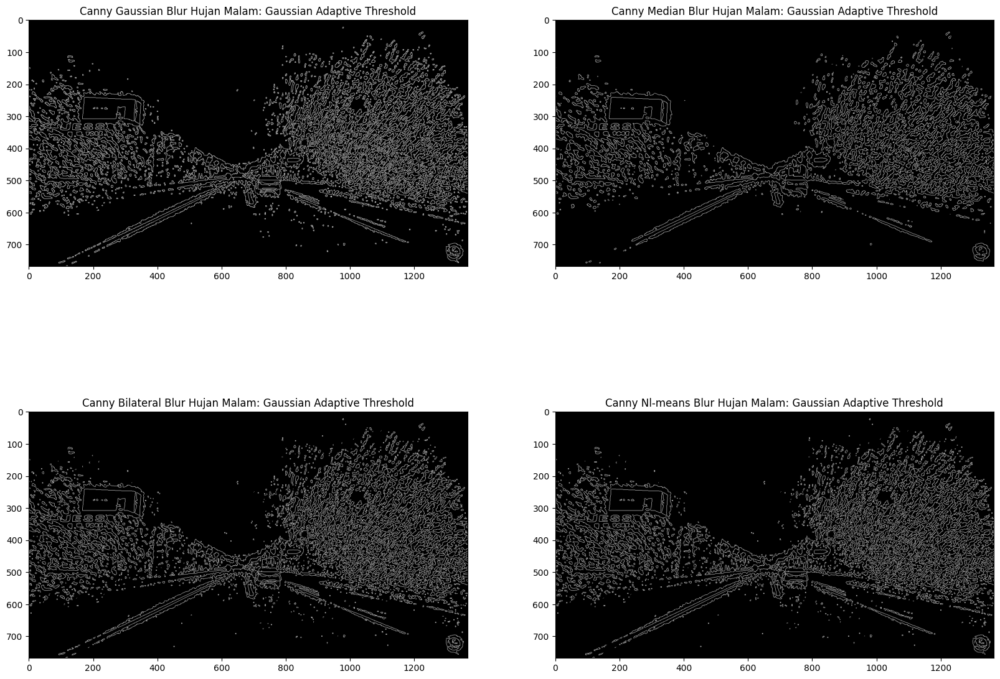

In [18]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianHMGAT = cv.Canny(gaussianHMGAT, 100, 200)
cannyMedianHMGAT = cv.Canny(medianHMGAT, 100, 200)
cannyBilateralHMGAT = cv.Canny(bilateralHMGAT, 100, 200)
cannyNlMeansHMGAT = cv.Canny(nl_meansHMGAT, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianHMGAT, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[0, 1].imshow(cannyMedianHMGAT, cmap='gray')
axs[0, 1].set_title('Canny Median Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[1, 0].imshow(cannyBilateralHMGAT, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur Hujan Malam: Gaussian Adaptive Threshold')
axs[1, 1].imshow(cannyNlMeansHMGAT, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur Hujan Malam: Gaussian Adaptive Threshold')

plt.show()

<h4>b. Mean Threshold</h4>

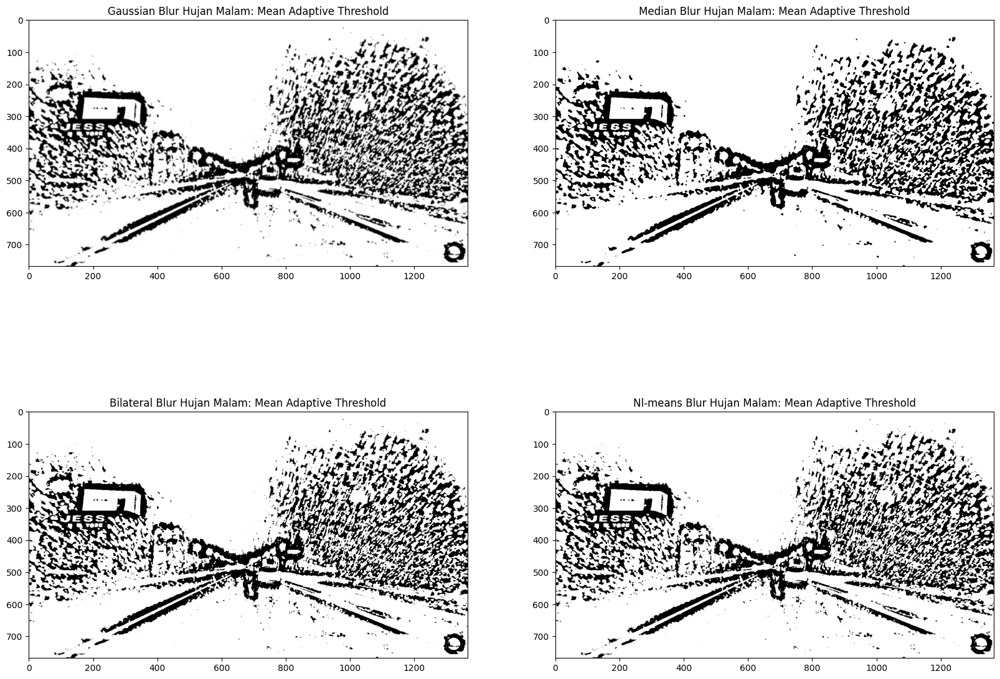

In [19]:
# filter Gaussian Blur
gaussianHMMAT = cv.GaussianBlur(meanTHHM, (5, 5), 0)

# filter Median Blur
medianHMMAT = cv.medianBlur(meanTHHM, 5)

# Bilateral Filter
bilateralHMMAT = cv.bilateralFilter(meanTHHM, 9, 75, 75)

# Non-local Means Filter
nl_meansHMMAT = cv.fastNlMeansDenoising(meanTHHM, None, 10, 10, 7)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(gaussianHMMAT, cmap='gray')
axs[0, 0].set_title('Gaussian Blur Hujan Malam: Mean Adaptive Threshold')
axs[0, 1].imshow(medianHMMAT, cmap='gray')
axs[0, 1].set_title('Median Blur Hujan Malam: Mean Adaptive Threshold')
axs[1, 0].imshow(bilateralHMMAT, cmap='gray')
axs[1, 0].set_title('Bilateral Blur Hujan Malam: Mean Adaptive Threshold')
axs[1, 1].imshow(nl_meansHMMAT, cmap='gray')
axs[1, 1].set_title('Nl-means Blur Hujan Malam: Mean Adaptive Threshold')

plt.show()

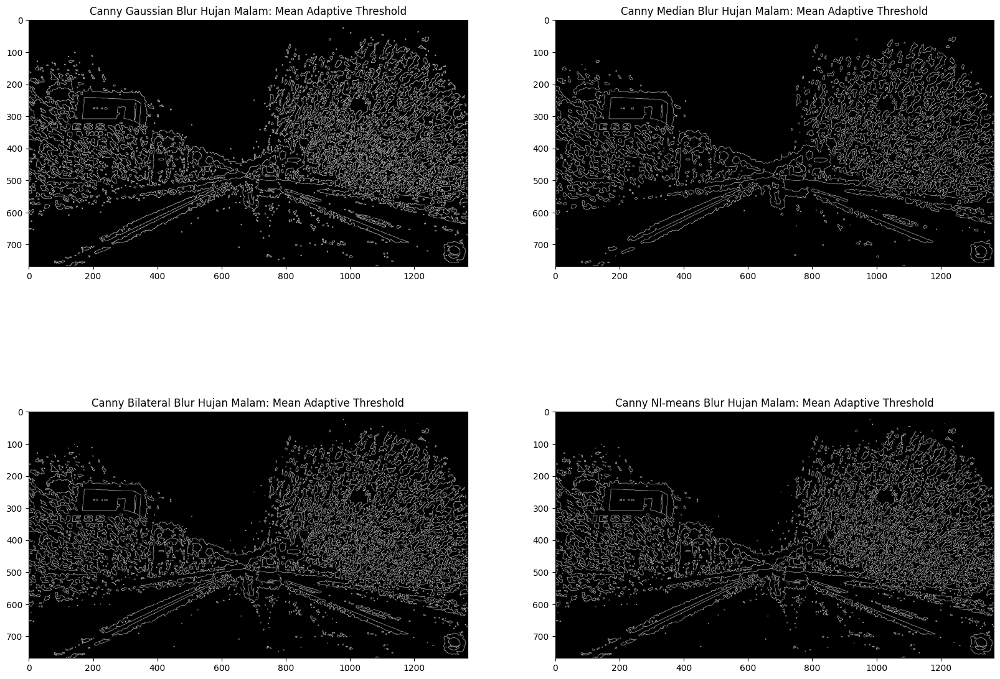

In [20]:
# Deteksi tepi menggunakan operator Canny
cannyGaussianHMMAT = cv.Canny(gaussianHMMAT, 100, 200)
cannyMedianHMMAT = cv.Canny(medianHMMAT, 100, 200)
cannyBilateralHMMAT = cv.Canny(bilateralHMMAT, 100, 200)
cannyNlMeansHMMAT = cv.Canny(nl_meansHMMAT, 100, 200)

fig, axs = plt.subplots(2, 2, figsize=(20, 15))
axs[0, 0].imshow(cannyGaussianHMMAT, cmap='gray')
axs[0, 0].set_title('Canny Gaussian Blur Hujan Malam: Mean Adaptive Threshold')
axs[0, 1].imshow(cannyMedianHMMAT, cmap='gray')
axs[0, 1].set_title('Canny Median Blur Hujan Malam: Mean Adaptive Threshold')
axs[1, 0].imshow(cannyBilateralHMMAT, cmap='gray')
axs[1, 0].set_title('Canny Bilateral Blur Hujan Malam: Mean Adaptive Threshold')
axs[1, 1].imshow(cannyNlMeansHMMAT, cmap='gray')
axs[1, 1].set_title('Canny Nl-means Blur Hujan Malam: Mean Adaptive Threshold')

plt.show()